# The Kaggle
```
CONFIDENTIAL
```

In [ ]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"keizergyy","key":"4b6048192bfddbccebbffbe18f8ed7ee"}'}

In [ ]:
# Buat folder dan pindahkan kaggle.json
!mkdir -p ~/.kaggle
!mv kaggle.json ~/.kaggle/

# Ubah permission agar bisa digunakan
!chmod 600 ~/.kaggle/kaggle.json

# Install kaggle CLI jika belum
!pip install -q kaggle

# Download dataset dari Kaggle
!kaggle datasets download -d muhammadalbrham/rgb-arabic-alphabets-sign-language-dataset
!kaggle datasets download -d rabieelkharoua/arsl-no-background-v2

# Unzip dataset
!unzip -q rgb-arabic-alphabets-sign-language-dataset.zip -d ./arabic_sign_language/
!unzip -q arsl-no-background-v2.zip -d ./arabic_sign_language/


mv: cannot stat 'kaggle.json': No such file or directory
Dataset URL: https://www.kaggle.com/datasets/rabieelkharoua/arsl-no-background-v2
License(s): CC-BY-SA-4.0
arsl-no-background-v2.zip: Skipping, found more recently modified local copy (use --force to force download)
replace ./arabic_sign_language/ARSL-No-BackGround-V2/Ain/Ain_0.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: A


# The Beginning

In this section, the data will be prepared so with the dependencies.

In [ ]:
import os
import io
import sys
import time
import random
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import numpy as np
import matplotlib.patches as mpatches
import cv2
import shutil

#!pip install mediapipe
import mediapipe as mp

from tqdm import tqdm
from google.colab import drive
from itertools import count
from PIL import Image
from IPython.display import display
from collections import Counter
from torchvision import transforms, datasets
from torch.utils.data import Dataset, DataLoader, random_split, Subset
from sklearn.model_selection import train_test_split
from torchsummary import summary
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

In [ ]:
dataset_path = './arabic_sign_language/RGB ArSL dataset'
dataset_path_nobg = './arabic_sign_language/ARSL-No-BackGround-V2'

def show_dataset_contents(path, label):
    if os.path.exists(path):
        print(f"\nIsi folder: {label}")
        folders = os.listdir(path)
        for folder in folders:
            folder_path = os.path.join(path, folder)
            if os.path.isdir(folder_path):
                total_files = len([
                    f for f in os.listdir(folder_path)
                    if os.path.isfile(os.path.join(folder_path, f))
                ])
                print(f"{folder}: {total_files} files")
    else:
        print(f"Folder {label} tidak ditemukan.")

# Tampilkan isi kedua dataset
show_dataset_contents(dataset_path, "RGB ArSL dataset")
show_dataset_contents(dataset_path_nobg, "RGB ArSL dataset no background")


Isi folder: RGB ArSL dataset
Zain: 201 files
Khah: 250 files
Ain: 244 files
Yeh: 272 files
Alef: 287 files
Sheen: 278 files
Qaf: 219 files
Tah: 226 files
Heh: 253 files
Dad: 266 files
Beh: 307 files
Sad: 270 files
Laa: 268 files
Teh_Marbuta: 257 files
Thal: 202 files
Teh: 311 files
Lam: 260 files
Reh: 227 files
Meem: 253 files
Noon: 237 files
Hah: 246 files
Theh: 305 files
Kaf: 264 files
Al: 276 files
Feh: 255 files
Waw: 249 files
Dal: 235 files
Seen: 266 files
Jeem: 210 files
Zah: 232 files
Ghain: 230 files

Isi folder: RGB ArSL dataset no background
Zain: 163 files
Khah: 212 files
Ain: 223 files
Yeh: 221 files
Alef: 275 files
Sheen: 265 files
Qaf: 200 files
Tah: 199 files
Heh: 239 files
Dad: 217 files
Beh: 290 files
Sad: 223 files
Laa: 248 files
Teh_Marbuta: 217 files
Thal: 147 files
Teh: 279 files
Lam: 231 files
Reh: 194 files
Meem: 233 files
Noon: 217 files
Hah: 217 files
Theh: 273 files
Kaf: 258 files
Al: 259 files
Feh: 234 files
Waw: 215 files
Dal: 191 files
Seen: 256 files
Jeem

In [ ]:
# Combine both dataset

if os.path.exists(dataset_path_nobg) and os.path.exists(dataset_path):
    src_folders = os.listdir(dataset_path_nobg)

    for folder in src_folders:
        src_folder_path = os.path.join(dataset_path_nobg, folder)
        dst_folder_path = os.path.join(dataset_path, folder)

        if not os.path.exists(dst_folder_path):
            os.makedirs(dst_folder_path)

        for file_name in os.listdir(src_folder_path):
            src_file = os.path.join(src_folder_path, file_name)
            dst_file = os.path.join(dst_folder_path, file_name)

            if not os.path.exists(dst_file):
                shutil.copy2(src_file, dst_file)
            else:
                base, ext = os.path.splitext(file_name)
                new_file_name = f"{base}_nobg{ext}"
                new_dst_file = os.path.join(dst_folder_path, new_file_name)
                shutil.copy2(src_file, new_dst_file)

    print("Dataset berhasil digabung berdasarkan folder yang sama.")
else:
    print("Salah satu path tidak ditemukan.")

print(os.listdir(dataset_path))

folders = os.listdir(dataset_path)
for folder in folders:
    folder_path = os.path.join(dataset_path, folder)
    if os.path.isdir(folder_path):
        total_files = len([
            f for f in os.listdir(folder_path)
            if os.path.isfile(os.path.join(folder_path, f))
        ])
        print(f"{folder}: {total_files} files")

Dataset berhasil digabung berdasarkan folder yang sama.
['Zain', 'Khah', 'Ain', 'Yeh', 'Alef', 'Sheen', 'Qaf', 'Tah', 'Heh', 'Dad', 'Beh', 'Sad', 'Laa', 'Teh_Marbuta', 'Thal', 'Teh', 'Lam', 'Reh', 'Meem', 'Noon', 'Hah', 'Theh', 'Kaf', 'Al', 'Feh', 'Waw', 'Dal', 'Seen', 'Jeem', 'Zah', 'Ghain']
Zain: 364 files
Khah: 462 files
Ain: 467 files
Yeh: 493 files
Alef: 562 files
Sheen: 543 files
Qaf: 419 files
Tah: 425 files
Heh: 492 files
Dad: 483 files
Beh: 597 files
Sad: 493 files
Laa: 516 files
Teh_Marbuta: 474 files
Thal: 349 files
Teh: 590 files
Lam: 491 files
Reh: 421 files
Meem: 486 files
Noon: 454 files
Hah: 463 files
Theh: 578 files
Kaf: 522 files
Al: 535 files
Feh: 489 files
Waw: 464 files
Dal: 426 files
Seen: 522 files
Jeem: 392 files
Zah: 433 files
Ghain: 436 files


which folder? Zah


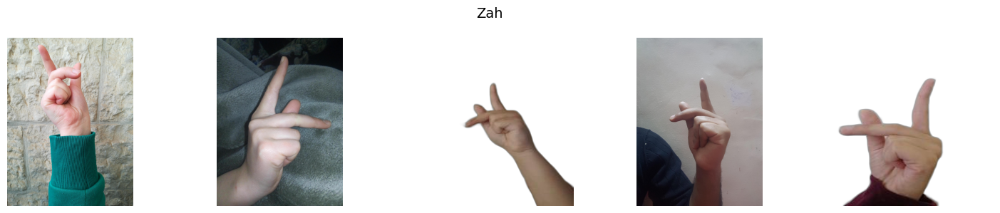

In [ ]:
def show_images_from_classes(class_names, dataset_path, num_images=5):
    for class_name in class_names:
        class_dir = os.path.join(dataset_path, class_name.strip())

        if not os.path.exists(class_dir):
            print(f"Folder '{class_name}' tidak ditemukan di dalam '{dataset_path}'")
            continue

        images = os.listdir(class_dir)[:num_images]

        plt.figure(figsize=(15, 3))
        plt.suptitle(f"{class_name}", fontsize=14)

        for i, img_name in enumerate(images, 1):
            img_path = os.path.join(class_dir, img_name)
            img = mpimg.imread(img_path)

            plt.subplot(1, num_images, i)
            plt.imshow(img)
            plt.axis("off")

        plt.tight_layout()
        plt.show()

input_folders = input("which folder? ")
selected_class_names = input_folders.split(',')

show_images_from_classes(selected_class_names, dataset_path)

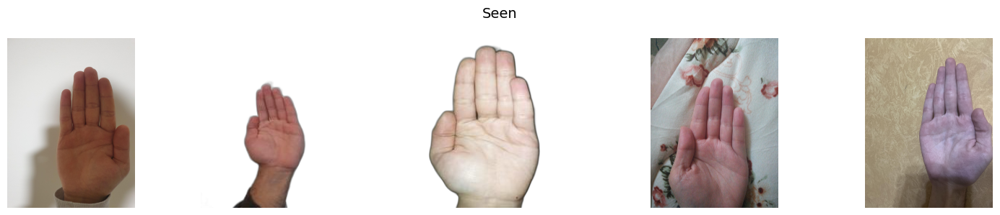

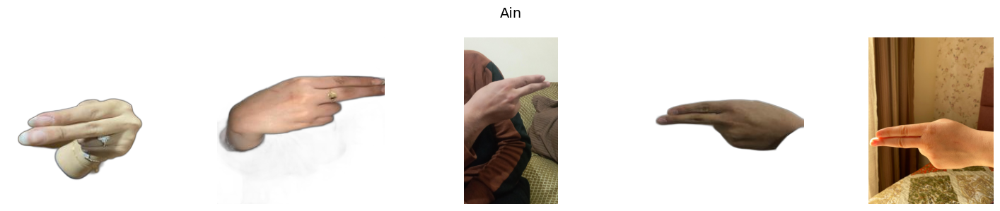

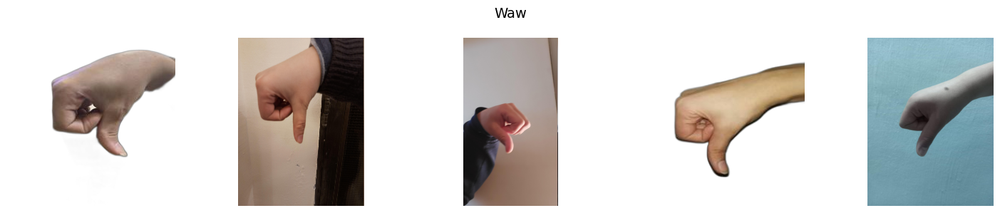

In [ ]:
#Read Data

class_folders = [folder for folder in os.listdir(dataset_path) if os.path.isdir(os.path.join(dataset_path, folder))]
selected_folders = random.sample(class_folders, 3)

for class_name in selected_folders:
  class_dir = os.path.join(dataset_path, class_name)
  images = os.listdir(class_dir)[:5]

  plt.figure(figsize=(15,3))
  plt.suptitle(f"{class_name}", fontsize = 14)

  for i, img_name in enumerate(images, 1):
    img_path = os.path.join(class_dir, img_name)
    img = mpimg.imread(img_path)

    plt.subplot(1, 5, i)
    plt.imshow(img)
    plt.axis("off")

  plt.tight_layout()
  plt.show()

In [ ]:
# Data Prep
mp_hands = mp.solutions.hands
hands = mp_hands.Hands(static_image_mode=True, max_num_hands=1, min_detection_confidence=0.5)

X_data, y_labels = [], []
label_to_index = {}
current_index = 0

def normalize_landmarks(landmark_list):
  base_x = landmark_list.landmark[0].x
  base_y = landmark_list.landmark[0].y
  norm = []
  for lm in landmark_list.landmark:
    norm.extend([lm.x - base_x, lm.y - base_y])
  return norm

def augment_landmarks(landmarks):
  if random.random() < 0.5:
    for i in range(0, len(landmarks), 2):
      landmarks[i] = -landmarks[i]

  angle = random.uniform(-15, 15)* np.pi / 180
  cos_val, sin_val = np.cos(angle), np.sin(angle)
  for i in range(0, len(landmarks), 2):
    x, y = landmarks[i], landmarks[i+1]
    landmarks[i] = cos_val * x - sin_val * y
    landmarks[i+1] = sin_val * x + cos_val * y
  return landmarks

for label_name in os.listdir(dataset_path):
  label_folder = os.path.join(dataset_path, label_name)
  if not os.path.isdir(label_folder):
    continue

  if label_name not in label_to_index:
    label_to_index[label_name] = current_index
    current_index += 1

  for img_file in tqdm(os.listdir(label_folder), desc=f"Processing {label_name}"):
    img_path = os.path.join(label_folder, img_file)
    image = cv2.imread(img_path)
    if image is None:
      continue

    img_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    result = hands.process(img_rgb)

    if result.multi_hand_landmarks:
      landmarks = result.multi_hand_landmarks[0]
      norm_landmarks = normalize_landmarks(landmarks)
      if len(norm_landmarks) == 42:
        X_data.append(norm_landmarks)
        y_labels.append(label_to_index[label_name])
        aug = augment_landmarks(norm_landmarks.copy())
        X_data.append(aug)
        y_labels.append(label_to_index[label_name])

Processing Ghain: 100%|██████████| 436/436 [00:39<00:00, 11.18it/s]


In [ ]:
# Modelling
X_train, X_test, y_train, y_test = train_test_split(X_data, y_labels, test_size=0.2, random_state=42)

class LandmarkDataset(Dataset):
  def __init__(self, X, y):
    self.X = torch.tensor(X, dtype=torch.float32)
    self.y = torch.tensor(y, dtype=torch.long)
  def __len__(self): return len(self.X)
  def __getitem__(self, idx): return self.X[idx], self.y[idx]

train_dl = DataLoader(LandmarkDataset(X_train, y_train), batch_size = 32, shuffle=True)
test_dl = DataLoader(LandmarkDataset(X_test, y_test), batch_size = 32, shuffle=False)

class MLP(nn.Module):
  def __init__(self, input_size=42, num_classes=len(label_to_index)):
    super(MLP, self).__init__()
    self.model = nn.Sequential(
        nn.Linear(input_size, 256),
        nn.ReLU(),
        nn.Dropout(0.3),
        nn.Linear(256, 128),
        nn.ReLU(),
        nn.Dropout(0.3),
        nn.Linear(128, 64),
        nn.ReLU(),
        nn.Linear(64, num_classes)
    )
  def forward(self, x): return self.model(x)

model = MLP()
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.0001)
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.5)

In [ ]:
# Training
best_acc = 0
patience = 5
trigger_times = 0

for epoch in range(100):
    model.train()
    total_loss = 0
    for X_batch, y_batch in train_dl:
        output = model(X_batch)
        loss = criterion(output, y_batch)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        total_loss += loss.item()

    scheduler.step()

    model.eval()
    y_true, y_pred = [], []
    with torch.no_grad():
      for X_batch, y_batch in test_dl:
        outputs = model(X_batch)
        preds = torch.argmax(outputs, dim=1)
        y_true.extend(y_batch.tolist())
        y_pred.extend(preds.tolist())

    acc = accuracy_score(y_true, y_pred)
    print(f"Epoch {epoch+1}, Loss: {total_loss:.4f}, Val Acc:{acc*100:.2f}%")

    if acc > best_acc + 0.003:
      best_acc = acc
      trigger_times = 0
      torch.save(model.state_dict(), 'hijaiyah_mlp_best.pth')
    else:
      trigger_times += 1
      if trigger_times >= patience:
        print("\nEarly stopping triggered.")
        break

Epoch 1, Loss: 2202.5659, Val Acc:17.05%
Epoch 2, Loss: 1714.6792, Val Acc:36.30%
Epoch 3, Loss: 1343.7829, Val Acc:50.36%
Epoch 4, Loss: 1114.7851, Val Acc:58.00%
Epoch 5, Loss: 975.3646, Val Acc:66.59%
Epoch 6, Loss: 877.3129, Val Acc:68.76%
Epoch 7, Loss: 807.1924, Val Acc:71.22%
Epoch 8, Loss: 739.9681, Val Acc:76.47%
Epoch 9, Loss: 687.8844, Val Acc:78.56%
Epoch 10, Loss: 640.8281, Val Acc:80.97%
Epoch 11, Loss: 618.3720, Val Acc:81.64%
Epoch 12, Loss: 597.2002, Val Acc:82.03%
Epoch 13, Loss: 581.9593, Val Acc:82.29%
Epoch 14, Loss: 568.1809, Val Acc:82.81%
Epoch 15, Loss: 553.3659, Val Acc:83.44%
Epoch 16, Loss: 547.1037, Val Acc:83.47%
Epoch 17, Loss: 537.8547, Val Acc:83.90%
Epoch 18, Loss: 523.1601, Val Acc:83.69%
Epoch 19, Loss: 517.0439, Val Acc:84.60%
Epoch 20, Loss: 508.4134, Val Acc:84.99%
Epoch 21, Loss: 503.1216, Val Acc:85.01%
Epoch 22, Loss: 500.6328, Val Acc:85.21%
Epoch 23, Loss: 492.7331, Val Acc:84.92%
Epoch 24, Loss: 491.1166, Val Acc:85.38%
Epoch 25, Loss: 482.3


Test Accuracy:85.86%

Classification Report:
              precision    recall  f1-score   support

        Zain       0.82      0.80      0.81       133
        Khah       0.79      0.82      0.80       133
         Ain       0.90      0.89      0.89       148
         Yeh       0.90      0.94      0.92       209
        Alef       0.93      0.97      0.95       214
       Sheen       0.78      0.84      0.81       204
         Qaf       0.92      0.92      0.92       155
         Tah       0.74      0.82      0.78       152
         Heh       0.88      0.93      0.90       150
         Dad       0.77      0.84      0.81       197
         Beh       0.92      0.90      0.91       227
         Sad       0.80      0.79      0.80       204
         Laa       0.99      0.93      0.96       188
 Teh_Marbuta       0.88      0.75      0.81       171
        Thal       0.84      0.87      0.85       147
         Teh       0.83      0.91      0.87       193
         Lam       0.92      0.92  

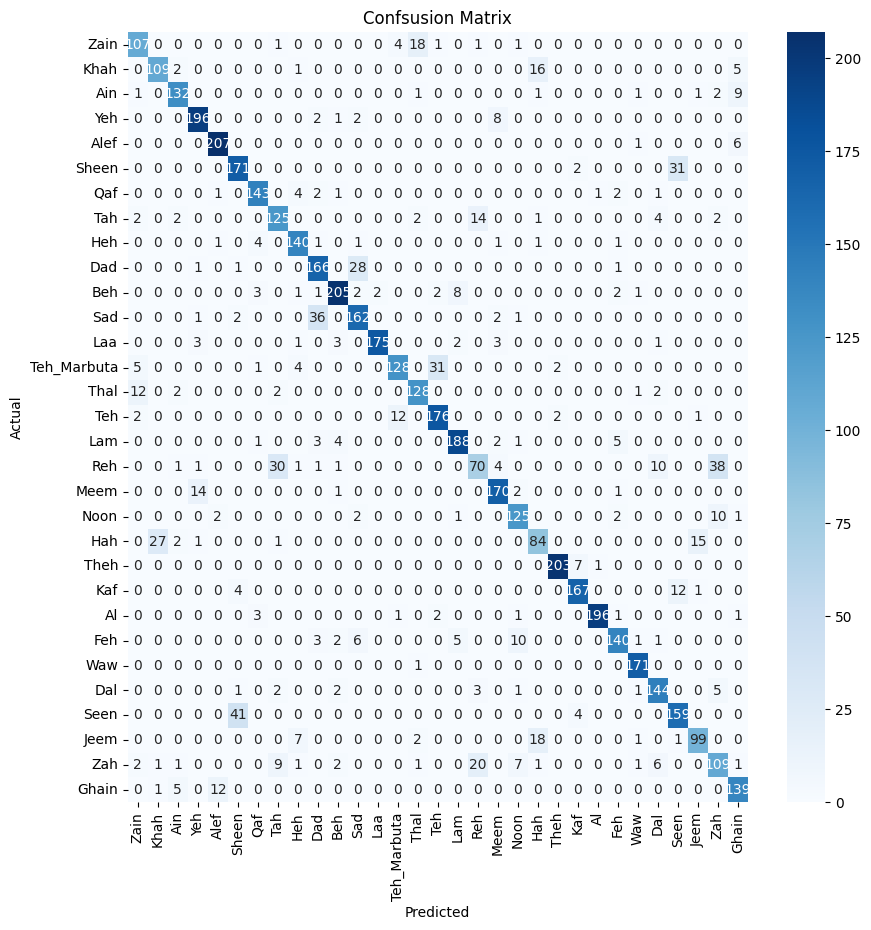

In [ ]:
# The Evaluation Metric

model.load_state_dict(torch.load('hijaiyah_mlp_best.pth'))
model.eval()
y_true, y_pred = [], []

with torch.no_grad():
  for X_batch, y_batch in test_dl:
    outputs = model(X_batch)
    preds = torch.argmax(outputs, dim=1)
    y_true.extend(y_batch.tolist())
    y_pred.extend(preds.tolist())

acc = accuracy_score(y_true, y_pred)
print(f"\nTest Accuracy:{acc*100:.2f}%")

index_to_label = {v: k for k, v in label_to_index.items()}
target_names = [index_to_label[i] for i in range(len(index_to_label))]

print("\nClassification Report:")
print(classification_report(y_true, y_pred, target_names=target_names))

cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(10,10))
sns.heatmap(cm, annot=True, fmt='d', xticklabels=target_names, yticklabels=target_names, cmap='Blues')
plt.title('Confsusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

with open('label_mapping.json', 'w') as f:
  import json
  json.dump(label_to_index, f)

In [ ]:
#Saving the model into gdrive

drive.mount('/content/drive')
destination_path = '/content/drive/My Drive/model_checkpoints/label_mapping.json'
# shutil.copy('hijaiyah_mlp_best.pth',destination_path)
shutil.copy('label_mapping.json',destination_path)

print(f"Model saved to {destination_path}")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Model saved to /content/drive/My Drive/model_checkpoints/label_mapping.json


# The Remains

In [ ]:
dataset_path = "dataset/ARSL-No-BackGround-V2"

class_folders = sorted(os.listdir(dataset_path))
print("Class folders: ", class_folders)

Class folders:  ['Ain', 'Al', 'Alef', 'Beh', 'Dad', 'Dal', 'Feh', 'Ghain', 'Hah', 'Heh', 'Jeem', 'Kaf', 'Khah', 'Laa', 'Lam', 'Meem', 'Noon', 'Qaf', 'Reh', 'Sad', 'Seen', 'Sheen', 'Tah', 'Teh', 'Teh_Marbuta', 'Thal', 'Theh', 'Waw', 'Yeh', 'Zah', 'Zain']


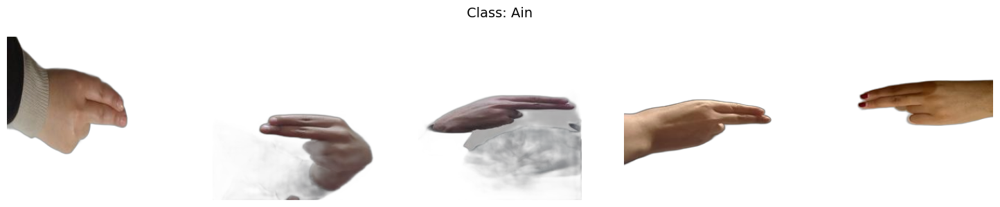

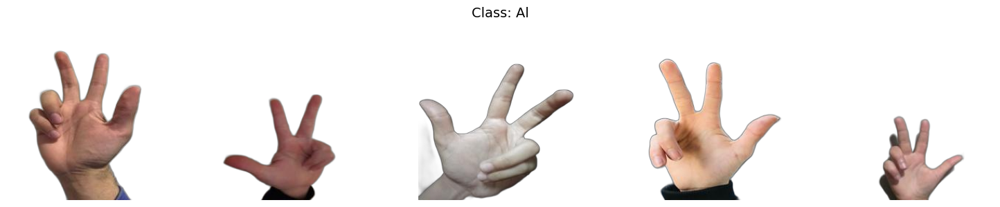

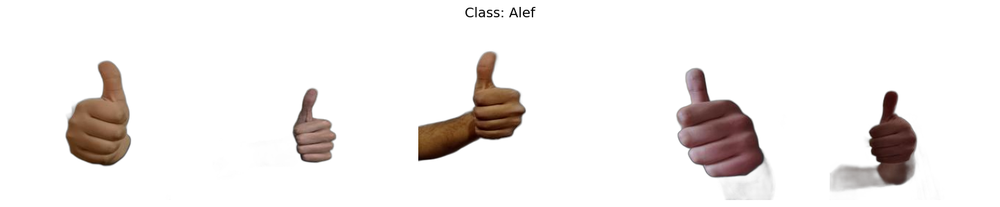

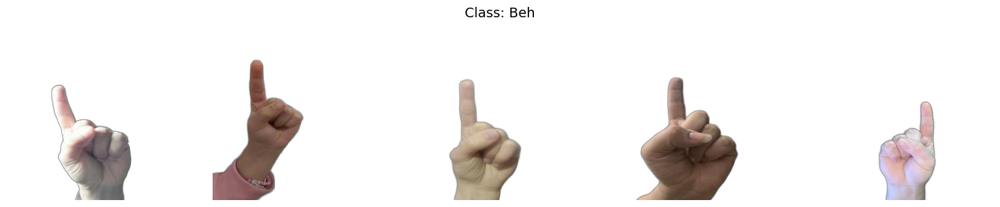

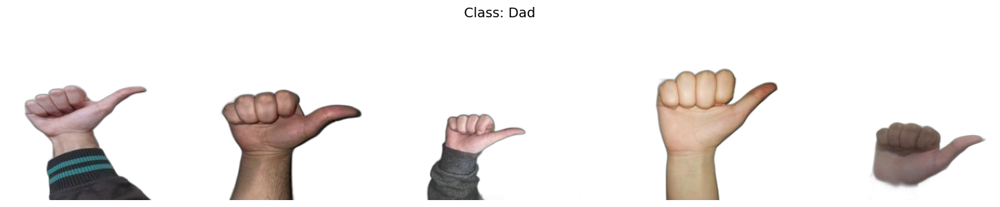

...

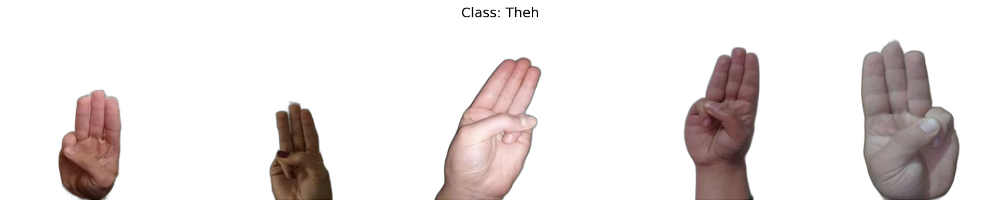

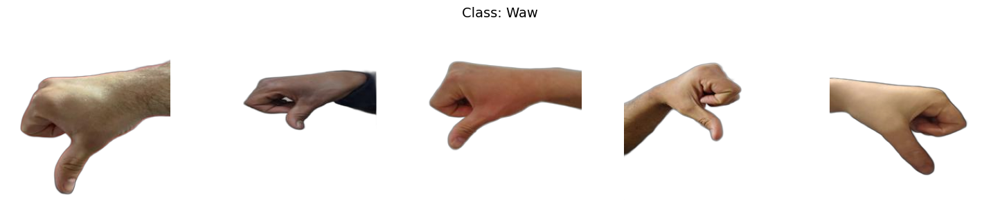

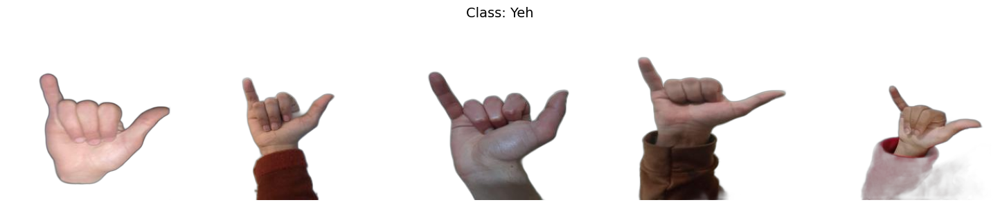

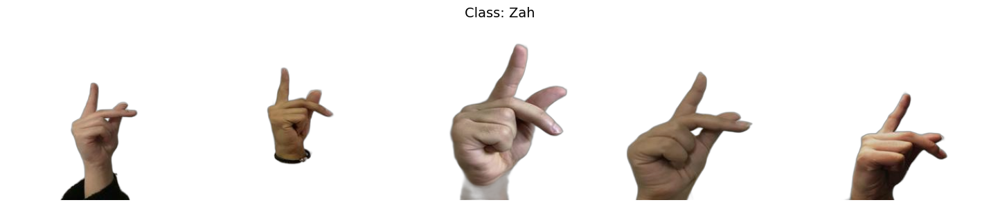

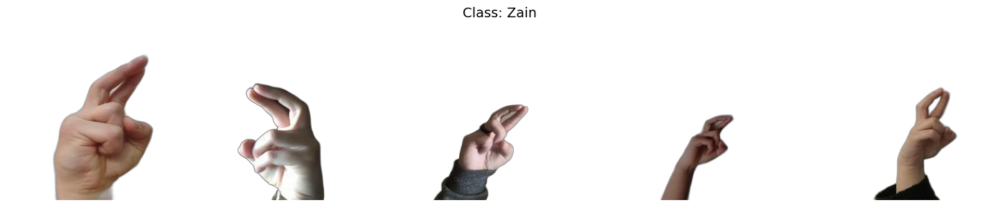

In [ ]:
for class_name in class_folders:
    class_dir = os.path.join(dataset_path, class_name)
    images = os.listdir(class_dir)[:5]

    plt.figure(figsize=(15, 3))
    plt.suptitle(f"Class: {class_name}", fontsize=14)

    for i, img_name in enumerate(images, 1):
        img_path = os.path.join(class_dir, img_name)
        img = Image.open(img_path)

        plt.subplot(1, 5, i)
        plt.imshow(img)
        plt.axis("off")

    plt.tight_layout()
    plt.show()

## The Prep

In [ ]:
# defining a function that transforms the dataset into pytorch-able

train_transforms = transforms.Compose([
    transforms.Resize(256),
    transforms.RandomCrop(224),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

val_test_transforms = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(244),
    transforms.ToTensor(),
    transforms.Normalize(
        mean = [0.485, 0.456, 0.406],
        std = [0.29, 0.224, 0.225]
    )
])

In [ ]:
#load the dataset with basic transforms

full_dataset = datasets.ImageFolder(
    root = dataset_path,
    transform = transforms.Compose([
        transforms.Resize(256),
        transforms.ToTensor()
    ])
)

In [ ]:
#The main idea is to make 3 splitted data (train, test, validation) 70:15:15
labels = [label for _, label in full_dataset.samples]

#split main data into data train and data temporary (70:30)
sss = StratifiedShuffleSplit(n_splits = 1,
                             test_size = 0.3,
                             random_state = 42)
train_indices, temp_indices = next(sss.split(range(len(full_dataset)), labels))

#split data temporary into test and validation (50:50)
sss_temp = StratifiedShuffleSplit(n_splits = 1,
                                  test_size = 0.5,
                                  random_state = 42)
val_indices, test_indices = next(sss_temp.split(temp_indices, [labels[i] for i in temp_indices]))

train_dataset = Subset(full_dataset, train_indices)
validation_dataset = Subset(full_dataset, val_indices)
test_dataset = Subset(full_dataset, test_indices)

In [ ]:
class ApplyTransform(Subset):
  def __init__(self, subset, transform):
    super().__init__(subset.dataset, subset.indices)
    self.transform = transform

  def __getitem__(self, idx):
    x, y = self.dataset[self.indices[idx]]
    if self.transform:
      x = self.transform(x)
    return(x, y)

train_dataset = ApplyTransform(train_dataset, train_transforms)
val_dataset = ApplyTransform(validation_dataset, val_test_transforms)
test_dataset = ApplyTransform(test_dataset, val_test_transforms)

In [ ]:
train_loader = DataLoader(train_dataset,
                          batch_size=32,
                          shuffle=True,
                          num_workers=2)

val_loader = DataLoader(validation_dataset,
                       batch_size=32,
                       shuffle=False,
                       num_workers=2)

test_loader = DataLoader(test_dataset,
                         batch_size=32,
                         shuffle=False,
                         num_workers=2)

Train Samples: 4889
Validation Samples: 1048
Test Samples: 1048


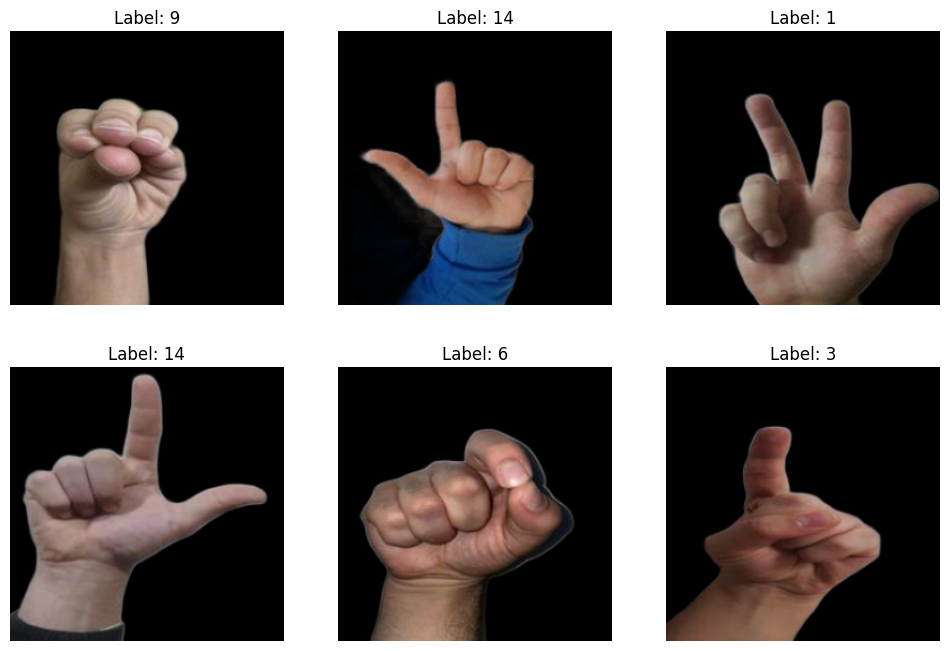

In [ ]:
print(f'Train Samples: {len(train_dataset)}')
print(f'Validation Samples: {len(val_dataset)}')
print(f'Test Samples: {len(test_dataset)}')

def ShowBatch(dataloader):
  images, labels = next(iter(dataloader))
  plt.figure(figsize=(12,8))
  for i in range (6):
    plt.subplot(2,3,i+1)
    img = images[i].permute(1,2,0).numpy()
    plt.imshow(img)
    plt.title(f'Label: {labels[i].item()}')
    plt.axis('off')
  plt.show()

ShowBatch(train_loader)

In [ ]:
#Model Architecture

class SimpleCNN(nn.Module):
  def __init__(self, num_classes):
    super(SimpleCNN, self).__init__()

    self.features = nn.Sequential(
        nn.Conv2d(3, 32, kernel_size=3, padding=1),
        nn.ReLU(),
        nn.MaxPool2d(2, 2),

        nn.Conv2d(32, 64, kernel_size=3, padding=1),
        nn.ReLU(),
        nn.MaxPool2d(2, 2)
    )

    self.flattened_size = self._calculate_flattened_size()

    self.classifier = nn.Sequential(
        nn.Linear(64 * 64 * 64, 512),
        nn.ReLU(),
        nn.Dropout(0.5),
        nn.Linear(512, num_classes)
    )

  def _calculate_flattened_size(self):
    dummy_input = torch.zeros(1, 3, 224, 224)
    dummy_output = self.features(dummy_input)
    return dummy_output.view(1, -1).size(1)

  def forward(self, x):
    x = self.features(x)
    x = torch.flatten(x, 1)
    x = self.classifier(x)
    return x

def progress_bar(iteration, total, bar_length = 30):
  percentage = (iteration / total) * 100
  filled_length = int(bar_length * iteration / total)
  bar = "█" * filled_length + "-" * (bar_length - filled_length)

  sys.stdout.write(f'\rProcessing Epoch {epoch+1}/{num_epochs}: {bar} {percentage:.2f}%')
  sys.stdout.flush()

In [ ]:
num_classes = 31
model = SimpleCNN(num_classes)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = model.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)
num_epochs = 20

In [ ]:
checkpoint_dir = '/content/drive/My Drive/model_checkpoints'
os.makedirs(checkpoint_dir, exist_ok=True)

best_val_accuracy = 0.0
patience = 3
train_losses = []
val_accuracies = []
last_val_accuracies = []

for epoch in range(num_epochs):
  model.train()
  running_loss = 0.0
  total_batches = len(train_loader)

  for batch_idx, (images, labels) in enumerate (train_loader, 1):
    images = images.to(device)
    labels = labels.to(device)

    outputs = model(images)
    loss = criterion(outputs, labels)

    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    running_loss += loss.item() * images.size(0)
    progress_bar(batch_idx, total_batches)

  print(f'\nLoss: {running_loss/len(train_loader):.4f}')
  epoch_loss = running_loss / len(train_dataset)
  train_losses.append(epoch_loss)

  model.eval()
  correct = 0
  total = 0

  with torch.no_grad():
    for images, labels in val_loader:
      images = images.to(device)
      labels = labels.to(device)

      outputs = model(images)
      _, predicted = torch.max(outputs.data, 1)
      total += labels.size(0)
      correct += (predicted == labels).sum().item()

  val_accuracy = 100 * correct / total
  val_accuracies.append(val_accuracy)
  print(f'Validation Accuracy: {val_accuracy:.2f}%')
  print()

  if val_accuracy > best_val_accuracy:
    best_val_accuracy = val_accuracy
    torch.save(model.state_dict(), 'best_model.pth')

  last_val_accuracies.append(val_accuracy)
  if len(last_val_accuracies) > patience:
    last_val_accuracies.pop(0)

  if len(last_val_accuracies) == patience:
    improvement = max(last_val_accuracies) - min(last_val_accuracies)
    if improvement <= 3.0:
      print('Early stopping triggered.')
      break

  if (epoch+1) % 5 == 0:
    checkpoint_path = os.path.join(checkpoint_dir, f'\ncheckpoint_epoch_{epoch+1}.pth')
    torch.save(model.state_dict(), checkpoint_path)
    print(f'\nCheckpoint saved at {checkpoint_path}\n')


Processing Epoch 1/20: ██████████████████████████████ 100.00%
Loss: 105.6677
Validation Accuracy: 35.02%

Processing Epoch 2/20: ██████████████████████████████ 100.00%
Loss: 77.8446
Validation Accuracy: 58.68%

Processing Epoch 3/20: ██████████████████████████████ 100.00%
Loss: 55.7938
Validation Accuracy: 70.13%

Processing Epoch 4/20: ██████████████████████████████ 100.00%
Loss: 38.7593
Validation Accuracy: 76.81%

Processing Epoch 5/20: ██████████████████████████████ 100.00%
Loss: 26.4133
Validation Accuracy: 79.96%


Checkpoint saved at /content/drive/My Drive/model_checkpoints/
checkpoint_epoch_5.pth

Processing Epoch 6/20: ██████████████████████████████ 100.00%
Loss: 17.0587
Validation Accuracy: 81.97%

Processing Epoch 7/20: ██████████████████████████████ 100.00%
Loss: 12.5747
Validation Accuracy: 82.35%

Early stopping triggered.


In [ ]:
torch.save(model.state_dict(), '/content/drive/My Drive/model_checkpoints/final_model.pth')
print(f'Model saved at {checkpoint_dir}')

Model saved at /content/drive/My Drive/model_checkpoints


In [ ]:
model.load_state_dict(torch.load('/content/drive/My Drive/model_checkpoints/final_model.pth'))
model.eval()
test_correct = 0
test_total = 0

with torch.no_grad():
  for images, labels in test_loader:
    images = images.to(device)
    labels = labels.to(device)

    outputs = model(images)
    _, predicted = torch.max(outputs.data, 1)

    test_total += labels.size(0)
    test_correct += (predicted == labels).sum().item()

print(f'Test Accuracy: {100 * test_correct/test_total:.2f}%')

<ipython-input-20-5cbb7970b230>:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('/content/drive/My Drive/model_checkpoints/final_model.pth'

Test Accuracy: 82.06%


Saving muslim-hand-sign-2FJR9F4.jpg to muslim-hand-sign-2FJR9F4.jpg


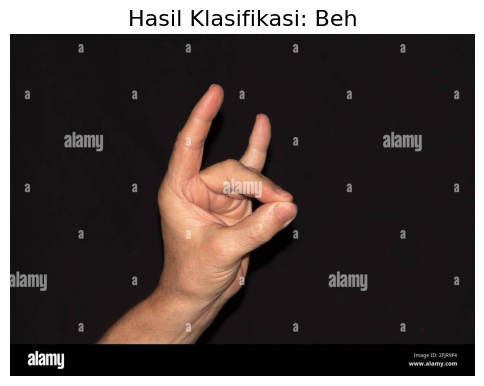

In [ ]:
transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

def predict_image(image_data, model, device):
    image = Image.open(io.BytesIO(image_data)).convert('RGB')
    image_tensor = transform(image)
    image_tensor = image_tensor.unsqueeze(0).to(device)

    model.eval()
    with torch.no_grad():
        output = model(image_tensor)
        _, predicted = torch.max(output.data, 1)

    return predicted.item(), image

uploaded = files.upload()
filename = next(iter(uploaded))
image_data = uploaded[filename]

predicted_class, image = predict_image(image_data, model, device)
predicted_folder = class_folders[predicted_class]

plt.figure(figsize=(6,6))
plt.imshow(image)
plt.title(f'Hasil Klasifikasi: {predicted_folder}', fontsize=16)
plt.axis('off')
plt.show()

<ipython-input-30-7a084a906477>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x='Outcome', y='Count', data=data, palette=['#69b3a2', 'Red'])


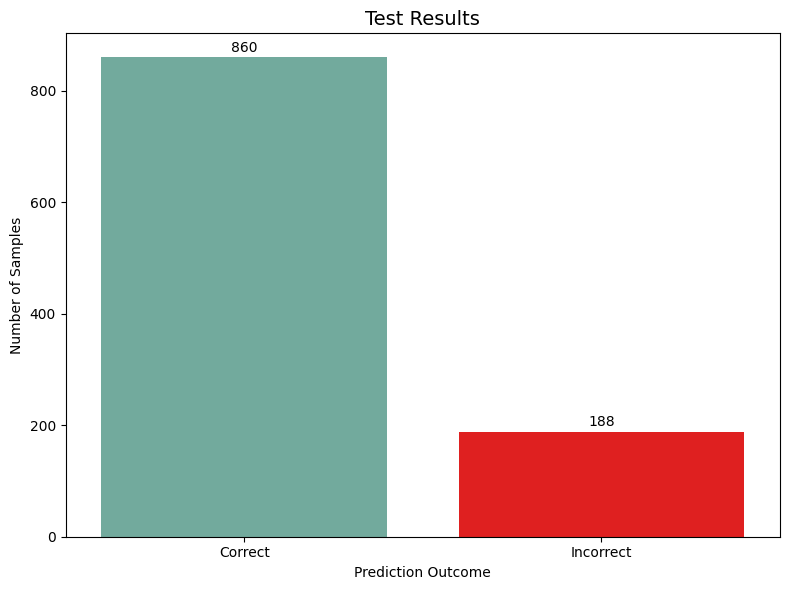

In [ ]:
data = {
    'Outcome': ['Correct', 'Incorrect'],
    'Count': [test_correct, test_total - test_correct]
}

plt.figure(figsize=(8, 6))
ax = sns.barplot(x='Outcome', y='Count', data=data, palette=['#69b3a2', 'Red'])

for p in ax.patches:
    ax.annotate(f'{int(p.get_height())}',
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center',
                xytext=(0, 7),
                textcoords='offset points')

plt.title('Test Results', fontsize=14)
plt.ylabel('Number of Samples')
plt.xlabel('Prediction Outcome')
plt.tight_layout()
plt.show()

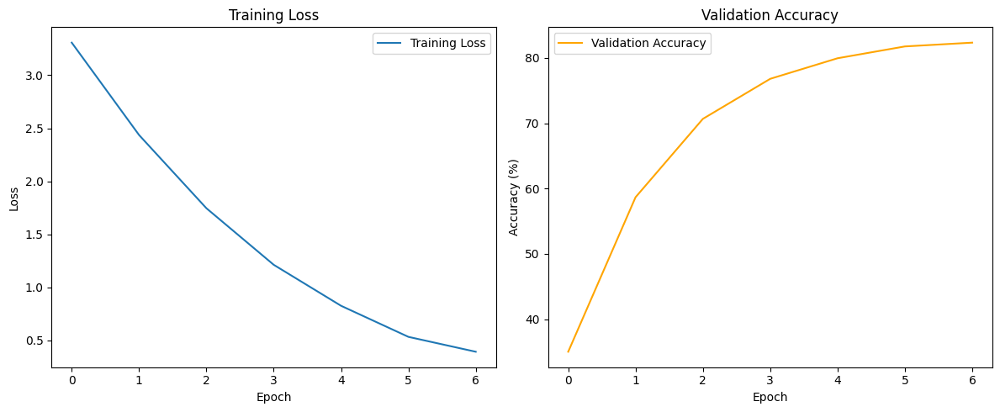

In [ ]:
plt.figure(figsize=(12, 5))

#Training Loss Graph
plt.subplot(1, 2, 1)
plt.plot(train_losses, label='Training Loss')
plt.title('Training Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

#Validation Accuracy Graph
plt.subplot(1, 2, 2)
plt.plot(val_accuracies, label='Validation Accuracy', color='orange')
plt.title('Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy (%)')
plt.legend()

plt.tight_layout()
plt.show()

NameError: name 'val_losses' is not defined

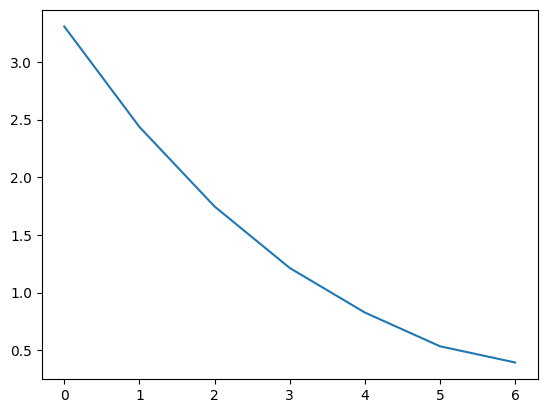

In [ ]:
plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss', linestyle = 'dashed')

plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

## SandBox

In [ ]:
def train_model(model, dataloaders, criterion, optimizer, num_epochs=25):
  since = time.time()

  test_acc_history = []
  test_loss_histroy = []
  train_acc_history = []
  train_loss_history = []

  best_model_wts = copy.deepcopy(model.state_dict())
  best_acc = 0.0

  for epoch in range(num_epochs):
    print(f'Epoch {epoch}/{num_epochs - 1}')

    for phase in ['train_dataset','test_dataset']:
      if phase == 'train_dataset':
        model.train()
      else:
        model.eval()

      running_loss = 0.0
      running_corrects = 0

      for inputs, labels in dataloaders[phase]:
        inputs = inputs.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()

      with torch.set_grad_enabled(phase == 'train_dataset'):
        outputs = model(inputs)
        loss = criterion(outputs, labels)

        _, preds = torch.max(outputs, 1)

        if phase == 'train_dataset':
          loss.backward()
          optimizer.step()

      running_loss += loss.item() * inputs.size(0)
      running_corrects += torch.sum(preds == labels.data)

    running_loss = running_loss / len(dataloaders[phase].dataset)
    running_acc = running_corrects.double() / len(dataloaders[phase].dataset)

    print('{} Loss: {.4f}, Acc: {:.4f}'.format(phase, epoch_loss, epoch_acc))

    if phase == 'test_dataset':
      test_acc_history.append(epoch_acc.cpu().numpy())
      test_loss_history.append(epoch_loss)
    if phase == 'train_dataset':
      train_acc_history.append(epoch_acc.cpu().numpy())
      train_loss_history.append(epoch_loss)

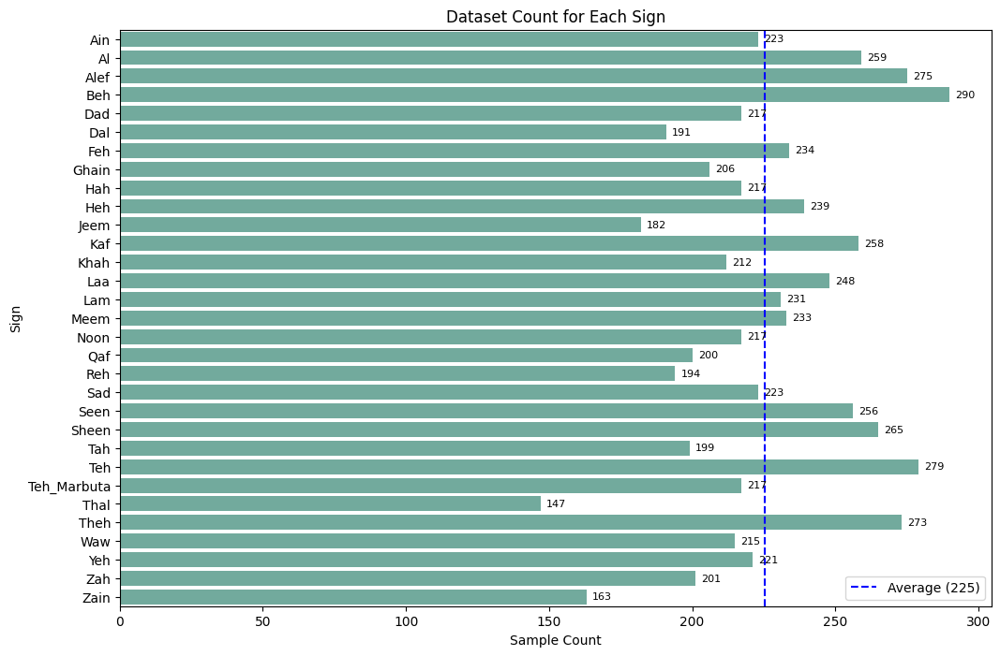

In [ ]:
labels = [label for _, label in full_dataset.samples]
label_counts = Counter(labels)

class_names = {v: f for f, v in full_dataset.class_to_idx.items()}
label_names = [class_names[idx] for idx in label_counts.keys()]
average_count = sum(label_counts.values()) / len(label_counts)

plt.figure(figsize=(12, 8))
ax = sns.barplot(x=list(label_counts.values()),
                 y=label_names,
                 color='#69b3a2')

for i, (v, label) in enumerate(zip(label_counts.values(), label_names)):
    ax.text(v + 2, i, str(v), va='center', fontsize=8)

plt.axvline(average_count,
            color='blue',
            linestyle='dashed',
            label=f'Average ({int(average_count)})')

plt.xlabel("Sample Count")
plt.ylabel("Sign")
plt.title("Dataset Count for Each Sign")
plt.legend()
plt.show()

In [ ]:
counts = []

for i in os.listdir(dataset_path):
  j = os.path.join(dataset_path, i)
  if os.path.isdir(j):
    file_count = len([f for f in os.listdir(j) if os.path.isfile(os.path.join(j, f))])
    # print(f"{i} - {file_count}")
    counts.append((i,file_count))

counts.sort(key=lambda x: x[1], reverse=True)

mid = len(counts)//2
high = counts[:mid]
low = counts[mid:]

for folder, count in high:
    print(f"{folder} - {count}")

# for folder, count in low:
#     print(f"{folder} - {count}")

Beh - 290
Teh - 279
Alef - 275
Theh - 273
Sheen - 265
Al - 259
Kaf - 258
Seen - 256
Laa - 248
Heh - 239
Feh - 234
Meem - 233
Lam - 231
Ain - 223
Sad - 223


In [ ]:
(290+279+275+273+265+259+258+256+248+239+234+233+231+223+223)/15

252.4

<ipython-input-15-3b6cc8228811>:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=list(label_counts.values()),


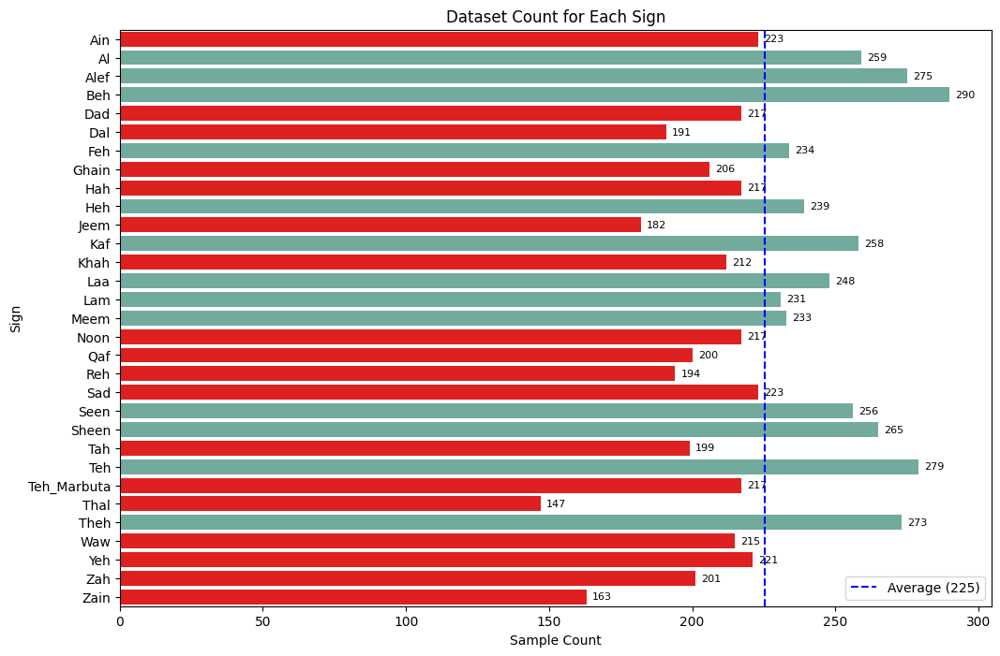

In [ ]:
labels = [label for _, label in full_dataset.samples]
label_counts = Counter(labels)

class_names = {v: f for f, v in full_dataset.class_to_idx.items()}
label_names = [class_names[idx] for idx in label_counts.keys()]
average_count = sum(label_counts.values()) / len(label_counts)

colors = ['red' if count < 225 else '#69b3a2' for count in label_counts.values()]

plt.figure(figsize=(12, 8))
ax = sns.barplot(x=list(label_counts.values()),
                 y=label_names,
                 palette=colors)

for i, (v, label) in enumerate(zip(label_counts.values(), label_names)):
    ax.text(v + 2, i, str(v), va='center', fontsize=8)

plt.axvline(average_count,
            color='blue',
            linestyle='dashed',
            label=f'Average ({int(average_count)})')

plt.xlabel("Sample Count")
plt.ylabel("Sign")
plt.title("Dataset Count for Each Sign")
plt.legend()
plt.show()

<ipython-input-16-5a4fc1f889d0>:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(a_counts.values()),
<ipython-input-16-5a4fc1f889d0>:71: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(b_counts.values()),


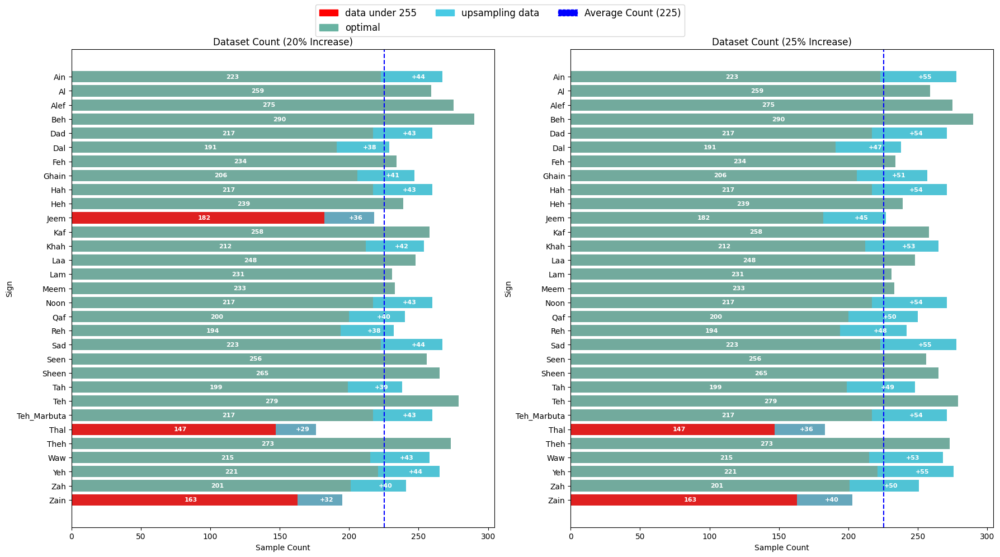

In [ ]:
labels = [label for _, label in full_dataset.samples]
label_counts = Counter(labels)

class_names = {v: f for f, v in full_dataset.class_to_idx.items()}
label_names = [class_names[idx] for idx in label_counts.keys()]
average_count = sum(label_counts.values()) / len(label_counts)
original_counts = label_counts.copy()
a_counts = original_counts.copy()
b_counts = original_counts.copy()


for key in a_counts:
  if a_counts[key] < 225:
    a_counts[key] = int(a_counts[key] * 1.2)

for key in b_counts:
  if b_counts[key] < 225:
    b_counts[key] = int(b_counts[key] * 1.25)

colors_a = ['red' if original_counts[key] < 190 else '#69b3a2' for key in label_counts.keys()]
colors_b = ['red' if original_counts[key] < 165 else '#69b3a2' for key in label_counts.keys()]

fig, axes = plt.subplots(1,2, figsize=(18,10))

# ----------------- Chart 1 -----------------
ax1 = axes[0]
sns.barplot(x=list(a_counts.values()),
            y=label_names,
            palette=colors_a,
            ax=ax1)

for i, (orig, new) in enumerate(zip(original_counts.values(), a_counts.values())):
  if orig < 225:
    ax1.barh(i,
            width=new - orig,
            left = orig,
            color = '#48cae4',
            alpha = 0.8)

for i, (orig, new) in enumerate(zip(original_counts.values(), a_counts.values())):
  ax1.text(orig/2,
          i,
          str(orig),
          va='center',
          fontsize=8,
          color='white',
          fontweight='bold')

  if orig < 225:
    add = new - orig
    mid_add= orig + add/ 2
    ax1.text(mid_add,
            i,
            f"+{add}",
            va = 'center',
            fontsize = 8,
            color = 'white',
            fontweight = 'bold')

ax1.axvline(average_count,
            color='blue',
            linestyle='dashed',
            label=f'Average ({int(average_count)})')

ax1.set_xlabel("Sample Count")
ax1.set_ylabel("Sign")
ax1.set_title("Dataset Count (20% Increase)")

# ----------------- Chart 2 -----------------
ax2 = axes[1]
sns.barplot(x=list(b_counts.values()),
            y=label_names,
            palette=colors_b,
            ax=ax2)

for i, (orig, new) in enumerate(zip(original_counts.values(), b_counts.values())):
    if orig < 225:
        ax2.barh(i,
                 width=new - orig,
                 left=orig,
                 color='#48cae4',
                 alpha=0.8)

for i, (orig, new) in enumerate(zip(original_counts.values(), b_counts.values())):
    ax2.text(orig / 2,
             i,
             str(orig),
             va='center',
             fontsize=8,
             color='white',
             fontweight='bold')

    if orig < 225:
        add = new - orig
        mid_add = orig + add / 2
        ax2.text(mid_add,
                 i,
                 f"+{add}",
                 va='center',
                 fontsize=8,
                 color='white',
                 fontweight='bold')

ax2.axvline(average_count,
            color='blue',
            linestyle='dashed',
            label=f'Average ({int(average_count)})')

ax2.set_xlabel("Sample Count")
ax2.set_ylabel("Sign")
ax2.set_title("Dataset Count (25% Increase)")

# ----------------- Legend -----------------
red = mpatches.Patch(color = 'red', label='data under 255')
green = mpatches.Patch(color = '#69b3a2', label='optimal')
blue = mpatches.Patch(color = '#48cae4', label='upsampling data')
dashed = mpatches.Patch(color='blue', linestyle='dashed', label='Average Count (225)')

fig.legend(handles=[red, green, blue, dashed], loc='upper center', ncol=3, fontsize=12)

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

In [ ]:
(258/227)

1.1365638766519823

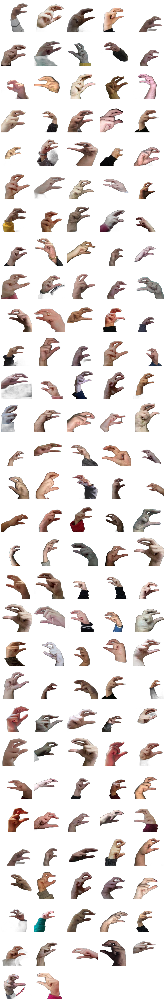

In [ ]:
folder_path = "dataset/ARSL-No-BackGround-V2/Thal"

image_files = [f for f in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, f))]

num_img = len(image_files)
cols = 5
rows = (num_img + cols - 1)

plt.figure(figsize=(15, 3 * rows))

for idx, i in enumerate(image_files):
  j = os.path.join(folder_path, i)
  img = Image.open(j)

  plt.subplot(rows, cols, idx + 1)
  plt.imshow(img)
  plt.axis('off')

plt.tight_layout()
plt.show()